<a href="https://colab.research.google.com/github/cjaradhye/hackbattlethe2nd/blob/main/GAN/stegos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [50]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [51]:
import os

if(not os.path.exists("/content/drive/MyDrive/stegos_datasets/div2k_zips")):
  !wget -P /content/drive/MyDrive/stegos_datasets/div2k_zips http://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_HR.zip
  !wget -P /content/drive/MyDrive/stegos_datasets/div2k_zips http://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_valid_HR.zip

In [52]:
if(not os.path.exists("/content/drive/MyDrive/stegos_datasets/DIV2K_train_HR")):
  !unzip /content/drive/MyDrive/Colab\ Notebooks/stegos_datasets/div2k_zips/DIV2K_train_HR.zip -d /content/drive/MyDrive/Colab\ Notebooks/stegos_datasets
  !unzip /content/drive/MyDrive/Colab\ Notebooks/stegos_datasets/div2k_zips/DIV2K_valid_HR.zip -d /content/drive/MyDrive/Colab\ Notebooks/stegos_datasets

In [53]:
import os

_, _, files_train = next(os.walk("/content/drive/MyDrive/stegos_datasets/DIV2K_train_HR"))
_, _, files_test = next(os.walk("/content/drive/MyDrive/stegos_datasets/DIV2K_valid_HR"))

print(f"Train {len(files_train)}")
print(f"Test {len(files_test)}")

Train 800
Test 100


In [54]:
def strToTensor(string, height, width):
  asciiArr = [ord(char) for char in string]

  normVals = [ascii / 255 for ascii in asciiArr]
  paddedVals = normVals + [0] * (height * width - len(normVals))

  tensor = torch.tensor(paddedVals).float().reshape(1, 1, height, width)

  return tensor

In [55]:
import torch
from torch import nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
import numpy as np

class Encoder(nn.Module):

  def __init__(self):
    super(Encoder, self).__init__()
    self.conv1 = nn.Sequential(
      nn.Conv2d(
        in_channels = 3,
        out_channels = 32,
        kernel_size = 5,
        padding = 1
      ),
      nn.ReLU()
    )

    self.conv2 = nn.Sequential(
      nn.Conv2d(
        in_channels = 33,
        out_channels = 33,
        kernel_size = 5,
        padding = 1
      ),
      nn.ReLU()
    )

    self.conv3 = nn.Conv2d(
      in_channels = 33,
      out_channels = 3,
      kernel_size = 5,
      padding = 1
    )


  def forward(self, img, string):
    out = self.conv1(img)
    data = strToTensor(string, out.shape[2], out.shape[3])
    print(out.shape, data.shape)
    out = torch.cat([out, data], dim=1)
    print(out.shape)
    out = self.conv2(out)
    print(out.shape)
    out = self.conv3(out)

    return out

In [56]:
from PIL import Image
from torchvision import transforms

img = Image.open("/content/drive/MyDrive/stegos_datasets/DIV2K_train_HR/0001.png")

transform = transforms.ToTensor()
imgTensor = transform(img)
imgTensor = imgTensor.unsqueeze(0)
imgTensor.shape

model = Encoder()
string = "Hello, world!"
binaryString = " ".join(map(bin,bytearray(string,'utf8')))
out = model(imgTensor, binaryString)

torch.Size([1, 32, 1402, 2038]) torch.Size([1, 1, 1402, 2038])
torch.Size([1, 33, 1402, 2038])
torch.Size([1, 33, 1400, 2036])


In [57]:
print(img.size)
print(imgTensor.shape)
print(out.shape)

(2040, 1404)
torch.Size([1, 3, 1404, 2040])
torch.Size([1, 3, 1398, 2034])


2040 1404 RGB PNG


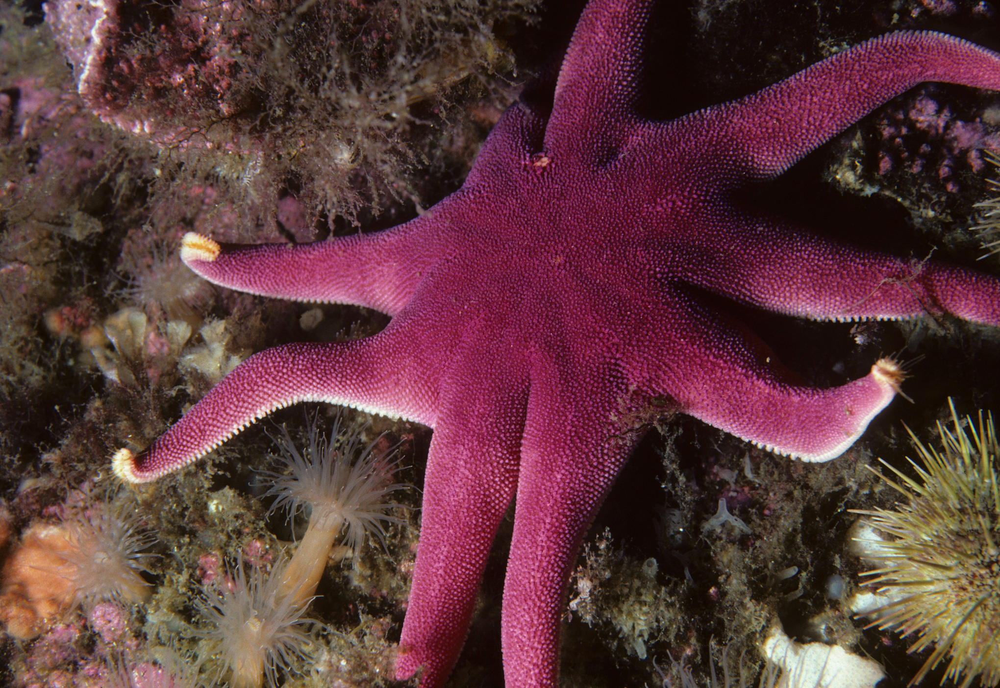

In [59]:
print(img.width, img.height, img.mode, img.format)
img

2034 1398 RGB None


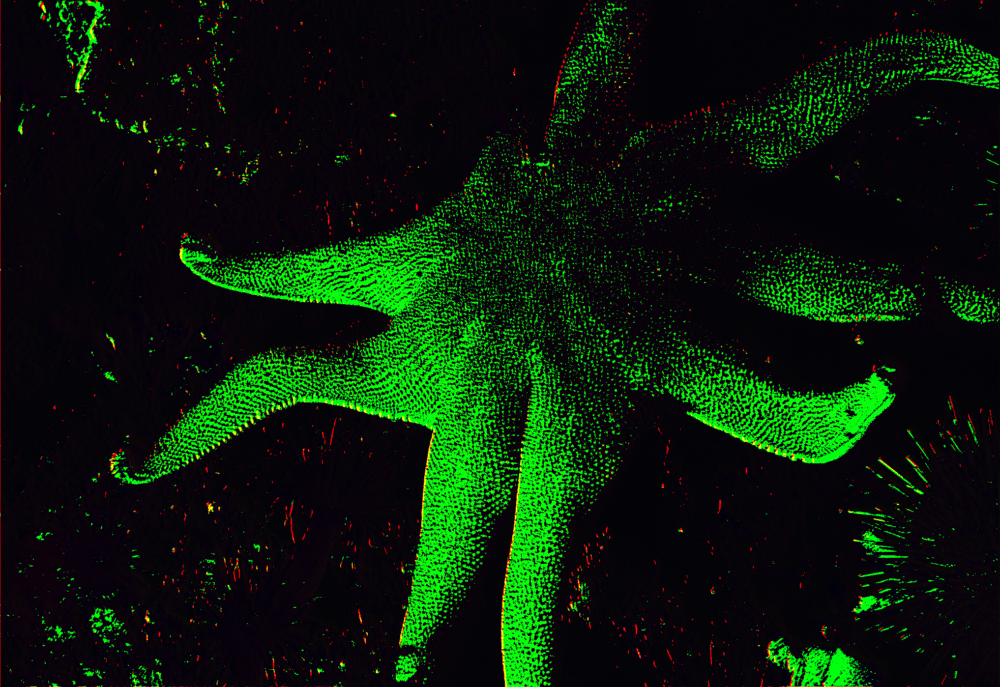

In [58]:
transform = transforms.ToPILImage()
encodedImg = transform(out.squeeze(0))

print(encodedImg.width, encodedImg.height, encodedImg.mode, encodedImg.format)
encodedImg

In [61]:
encodedImg.save("encodedImg.png", "PNG")

In [14]:
class Decoder(nn.Module):

  def __init__(self):
    super(Decoder, self).__init__()
    self.conv1 = nn.Sequential(
      nn.Conv2d(
        in_channels = 3,
        out_channels = 32,
        kernel_size = 5,
        padding = 1
      ),
      nn.ReLU()
    )

    self.conv2 = nn.Sequential(
      nn.Conv2d(
        in_channels = 32,
        out_channels = 32,
        kernel_size = 5,
        padding = 1
      ),
      nn.ReLU()
    )

    self.conv3 = nn.Sequential(
      nn.Conv2d(
        in_channels = 32,
        out_channels = 32,
        kernel_size = 5,
        padding = 1
      ),
      nn.ReLU()
    )

    self.conv4 = nn.Conv2d(
      in_channels = 32,
      out_channels = 3,
      kernel_size = 5,
      padding = 1
    )


  def forward(self, img):
    out = self.conv1(img)
    out = self.conv2(out)
    out = self.conv3(out)
    out = self.conv4(out)

    return out

In [62]:
from PIL import Image
from torchvision import transforms

img = Image.open("/content/encodedImg.png")

transform = transforms.ToTensor()
imgTensor = transform(img)
imgTensor = imgTensor.unsqueeze(0)
imgTensor.shape

model = Decoder()
out = model(imgTensor)

In [65]:
transform = transforms.ToPILImage()
decodedImg = transform(out.squeeze(0))

print(decodedImg.width, decodedImg.height, decodedImg.mode, decodedImg.format)
decodedImg

decodedImg.save("decodedImg.png", "PNG")

2026 1390 RGB None


In [67]:
class Critic(nn.Module):

  def __init__(self):
    super(Critic, self).__init__()
    self.conv1 = nn.Sequential(
      nn.Conv2d(
        in_channels = 3,
        out_channels = 32,
        kernel_size = 5,
        padding = 1
      ),
      nn.ReLU()
    )

    self.conv2 = nn.Sequential(
      nn.Conv2d(
        in_channels = 32,
        out_channels = 32,
        kernel_size = 5,
        padding = 1
      ),
      nn.ReLU()
    )

    self.conv3 = nn.Sequential(
      nn.Conv2d(
        in_channels = 32,
        out_channels = 32,
        kernel_size = 5,
        padding = 1
      ),
      nn.ReLU()
    )

    self.conv4 = nn.Conv2d(
      in_channels = 32,
      out_channels = 3,
      kernel_size = 5,
      padding = 1
    )


  def forward(self, img):
    out = self.conv1(img)
    out = self.conv2(out)
    out = self.conv3(out)
    out = self.conv4(out)

    return torch.mean(out.view(out.shape[0], -1), dim=1)

In [70]:
from PIL import Image
from torchvision import transforms

img = Image.open("/content/decodedImg.png")

transform = transforms.ToTensor()
imgTensor = transform(img)
imgTensor = imgTensor.unsqueeze(0)
imgTensor.shape

model = Critic()
mean = model(imgTensor)

print(out.shape, "\n", out)

torch.Size([1, 3, 1390, 2026]) 
 tensor([[[[-0.0066, -0.0039, -0.0049,  ..., -0.0049, -0.0044, -0.0019],
          [-0.0138, -0.0073, -0.0068,  ..., -0.0068, -0.0063, -0.0035],
          [-0.0154, -0.0075, -0.0058,  ..., -0.0066, -0.0060, -0.0019],
          ...,
          [-0.0147, -0.0083, -0.0066,  ..., -0.0072, -0.0063, -0.0017],
          [-0.0145, -0.0095, -0.0073,  ..., -0.0078, -0.0073, -0.0021],
          [-0.0119, -0.0048, -0.0028,  ..., -0.0035, -0.0037,  0.0025]],

         [[ 0.0112,  0.0124,  0.0152,  ...,  0.0125,  0.0126,  0.0092],
          [ 0.0110,  0.0115,  0.0136,  ...,  0.0121,  0.0120,  0.0087],
          [ 0.0121,  0.0119,  0.0132,  ...,  0.0117,  0.0114,  0.0081],
          ...,
          [ 0.0128,  0.0124,  0.0138,  ...,  0.0124,  0.0119,  0.0087],
          [ 0.0107,  0.0108,  0.0126,  ...,  0.0113,  0.0113,  0.0080],
          [ 0.0089,  0.0082,  0.0067,  ...,  0.0069,  0.0065,  0.0044]],

         [[ 0.0161,  0.0147,  0.0172,  ...,  0.0168,  0.0168,  0.0200

In [33]:
from torch.utils.data import DataLoader
from torchvision import datasets, transforms

def get_dataset(batch_size=4):
    transform = transforms.Compose([
        transforms.Resize((64, 64)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5]*3, std=[0.5]*3)
    ])

    # trainData = datasets.ImageFolder("/content/drive/MyDrive/stegos_datasets/DIV2K_train_HR", transform=transform)
    #validData = datasets.ImageFolder("/content/drive/MyDrive/stegos_datasets/DIV2K_valid_HR", transform=transform)
    trainData = files_test
    validData = files_train

    trainLoader = DataLoader(trainData, batch_size=batch_size, shuffle=True)
    validLoader = DataLoader(validData, batch_size=batch_size, shuffle=False)

    return trainLoader, validLoader

In [27]:
!pip install tqdm

In [48]:
from tqdm import tqdm

def train(epochs, encoder, decoder, critic, optimizer, trainLoader, device):
  for epoch in range(epochs):
    for imgs in tqdm(trainLoader):
      for imgLoc in imgs:
        img = Image.open(f"/content/drive/MyDrive/stegos_datasets/DIV2K_valid_HR/{imgLoc}")

        transform = transforms.ToTensor()
        imgTensor = transform(img)
        imgTensor = imgTensor.unsqueeze(0)
        imgTensor.shape

        model = Encoder()
        string = "Hello, world!"
        binaryString = " ".join(map(bin,bytearray(string,'utf8')))
        out = model(imgTensor, binaryString)

        encoded = encoder(img, binaryString)
        decoded = decoder(img)
        real_score = critic(img)
        fake_score = critic(img)

        recon_loss = nn.MSELoss()(decoded, img)
        critic_loss = real_score.mean() - fake_score.mean()

        optimizer.zero_grad()
        (recon_loss + critic_loss).backward()
        optimizer.step()

        print(f'Epoch {epoch+1}/{epochs}, Recon Loss: {recon_loss.item():.4f}, Critic Loss: {critic_loss.item():.4f}')

In [46]:
from torch.optim import Adam

def main():
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    encoder = Encoder().to(device)
    decoder = Decoder().to(device)
    critic = Critic().to(device)
    optimizer = Adam(list(encoder.parameters()) + list(decoder.parameters()) + list(critic.parameters()), lr=1e-4)

    train_loader, valid_loader = get_dataset()
    epochs = 5

    train(epochs, encoder, decoder, critic, optimizer, train_loader, device)

In [49]:
if __name__ == "__main__":
  main()

  0%|          | 0/25 [00:00<?, ?it/s]

torch.Size([1, 32, 1126, 2038]) torch.Size([1, 1, 1126, 2038])
torch.Size([1, 33, 1126, 2038])
torch.Size([1, 33, 1124, 2036])


  0%|          | 0/25 [00:10<?, ?it/s]


TypeError: conv2d() received an invalid combination of arguments - got (PngImageFile, Parameter, Parameter, tuple, tuple, tuple, int), but expected one of:
 * (Tensor input, Tensor weight, Tensor bias = None, tuple of ints stride = 1, tuple of ints padding = 0, tuple of ints dilation = 1, int groups = 1)
      didn't match because some of the arguments have invalid types: (!PngImageFile!, !Parameter!, !Parameter!, !tuple of (int, int)!, !tuple of (int, int)!, !tuple of (int, int)!, !int!)
 * (Tensor input, Tensor weight, Tensor bias = None, tuple of ints stride = 1, str padding = "valid", tuple of ints dilation = 1, int groups = 1)
      didn't match because some of the arguments have invalid types: (!PngImageFile!, !Parameter!, !Parameter!, !tuple of (int, int)!, !tuple of (int, int)!, !tuple of (int, int)!, !int!)
